In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
plt.rcParams['figure.figsize'] = (10,5)
plt.rcParams['figure.dpi'] = 250
sns.set_style('darkgrid')
import warnings
warnings.filterwarnings('ignore')
%matplotlib inline

CLUSTERING ANALYSIS 

Understanding and Implementing K-Means, Hierarchical, and DBSCAN Algorithms

Objective:
The objective of this assignment is to introduce to various clustering algorithms, including K-Means, hierarchical, and DBSCAN, and provide hands-on experience in applying these techniques to a real-world dataset.
Datasets :
Data Preprocessing:
1.	Preprocess the dataset to handle missing values, remove outliers, and scale the features if necessary.
2.	Perform exploratory data analysis (EDA) to gain insights into the distribution of data and identify potential clusters.
3.	Use multiple visualizations to understand the hidden patterns in the dataset
Implementing Clustering Algorithms:
•	Implement the K-Means, hierarchical, and DBSCAN algorithms using a programming language such as Python with libraries like scikit-learn or MATLAB.
•	Apply each clustering algorithm to the pre-processed dataset to identify clusters within the data.
•	Experiment with different parameter settings for hierarchical clustering (e.g., linkage criteria), K-means (Elbow curve for different K values) and DBSCAN (e.g., epsilon, minPts) and evaluate the clustering results.

Cluster Analysis and Interpretation:
•	Analyse the clusters generated by each clustering algorithm and interpret the characteristics of each cluster. Write you insights in few comments.

Visualization:
Visualize the clustering results using scatter plots or other suitable visualization techniques.
Plot the clusters with different colours to visualize the separation of data points belonging to different clusters.
Evaluation and Performance Metrics:
Evaluate the quality of clustering using internal evaluation metrics such as silhouette score for K-Means and DBSCAN.


In [2]:
df = pd.read_csv(r"C:\Users\durwa\Downloads\Copy of EastWestAirlines.csv")

In [3]:
df

,ID#,Balance,Qual_miles,cc1_miles,cc2_miles,cc3_miles,Bonus_miles,Bonus_trans,Flight_miles_12mo,Flight_trans_12,Days_since_enroll,Award?
0,1,28143,0,1,1,1,174,1,0,0,7000,0
1,2,19244,0,1,1,1,215,2,0,0,6968,0
2,3,41354,0,1,1,1,4123,4,0,0,7034,0
3,4,14776,0,1,1,1,500,1,0,0,6952,0
4,5,97752,0,4,1,1,43300,26,2077,4,6935,1
...,...,...,...,...,...,...,...,...,...,...,...,...
3994,4017,18476,0,1,1,1,8525,4,200,1,1403,1
3995,4018,64385,0,1,1,1,981,5,0,0,1395,1
3996,4019,73597,0,3,1,1,25447,8,0,0,1402,1
3997,4020,54899,0,1,1,1,500,1,500,1,1401,0


In [4]:
df.isna()

,ID#,Balance,Qual_miles,cc1_miles,cc2_miles,cc3_miles,Bonus_miles,Bonus_trans,Flight_miles_12mo,Flight_trans_12,Days_since_enroll,Award?
0,False,False,False,False,False,False,False,False,False,False,False,False
1,False,False,False,False,False,False,False,False,False,False,False,False
2,False,False,False,False,False,False,False,False,False,False,False,False
3,False,False,False,False,False,False,False,False,False,False,False,False
4,False,False,False,False,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...
3994,False,False,False,False,False,False,False,False,False,False,False,False
3995,False,False,False,False,False,False,False,False,False,False,False,False
3996,False,False,False,False,False,False,False,False,False,False,False,False
3997,False,False,False,False,False,False,False,False,False,False,False,False


In [5]:
df.isna().sum()

ID#                  0
Balance              0
Qual_miles           0
cc1_miles            0
cc2_miles            0
cc3_miles            0
Bonus_miles          0
Bonus_trans          0
Flight_miles_12mo    0
Flight_trans_12      0
Days_since_enroll    0
Award?               0
dtype: int64

<Axes: >

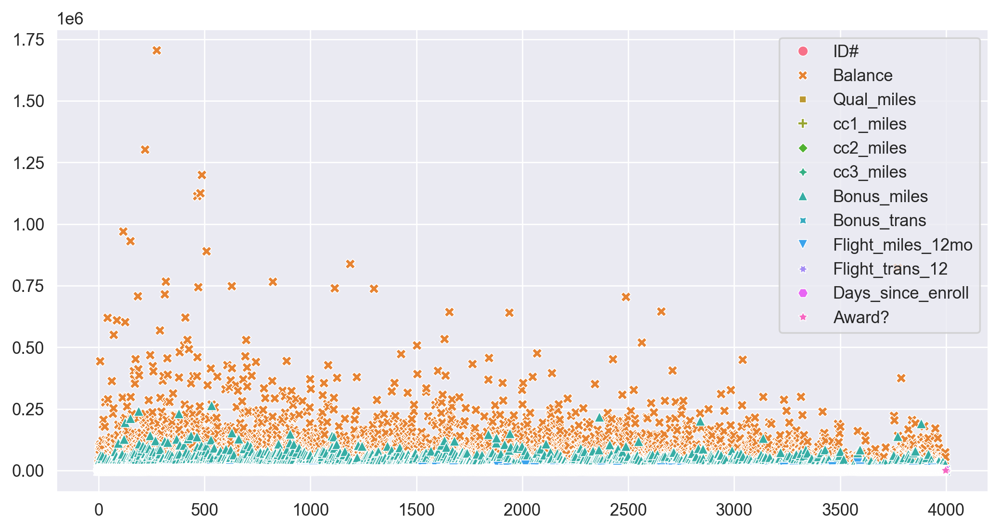

In [6]:
sns.scatterplot(df)

In [7]:
sns.pairplot(df)

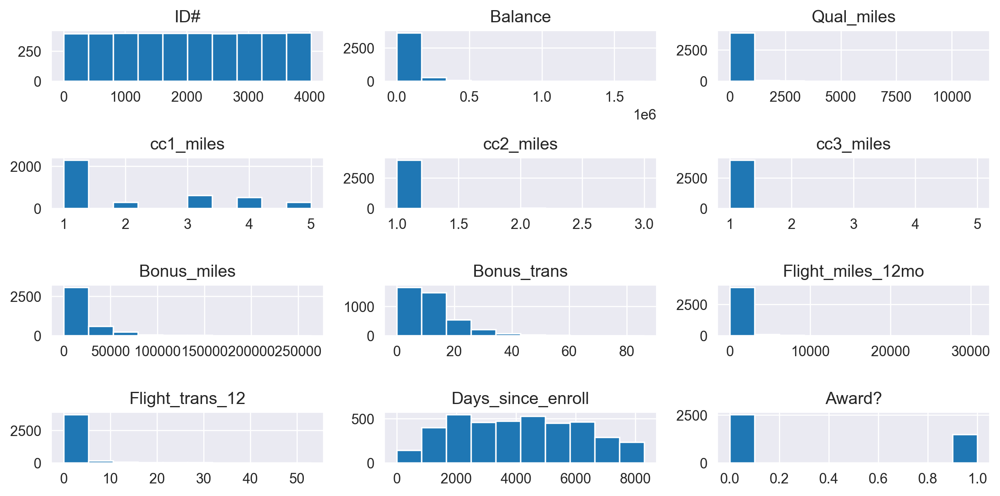

In [8]:
df.hist()
plt.tight_layout()

<Axes: >

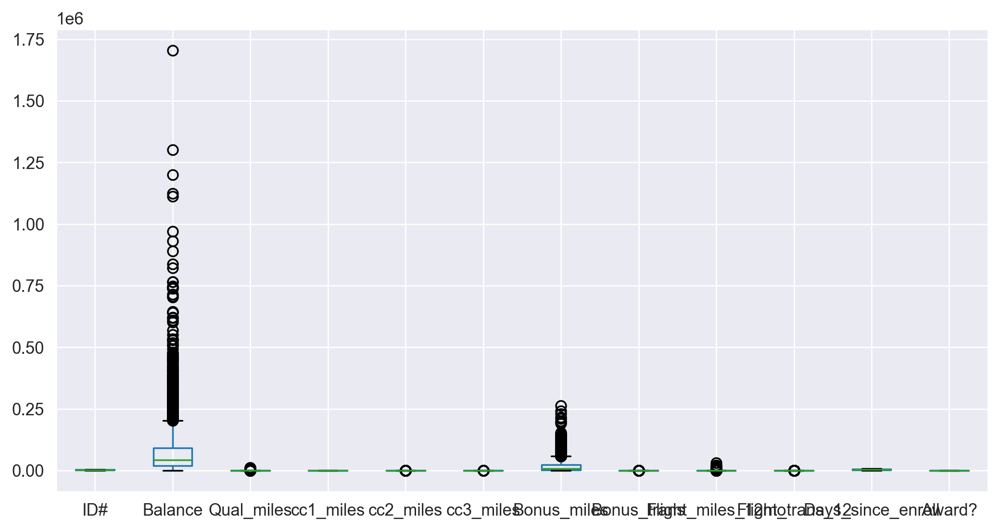

In [9]:
df.boxplot()

In [10]:
def outlier_detection(data, columns):
    
    for col in columns:
        q1 = data[col].quantile(0.25)
        q3 = data[col].quantile(0.75)
        iqr = q3-q1
    
        lower = q1-(1.5*iqr)
        upper = q3+(1.5*iqr)
        
        df[col] = np.where(df[col] > upper, upper, np.where(df[col] < lower, lower,df[col]))

In [11]:
df.columns

Index(['ID#', 'Balance', 'Qual_miles', 'cc1_miles', 'cc2_miles', 'cc3_miles',
       'Bonus_miles', 'Bonus_trans', 'Flight_miles_12mo', 'Flight_trans_12',
       'Days_since_enroll', 'Award?'],
      dtype='object')

In [12]:
outlier_detection(df,df.columns)

<Axes: >

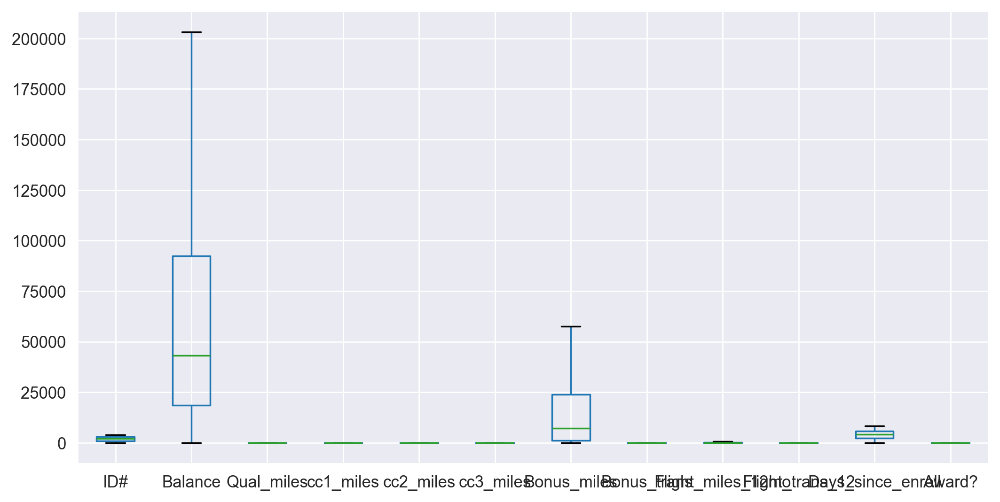

In [13]:
df.boxplot()

<Axes: xlabel='Balance', ylabel='Bonus_miles'>

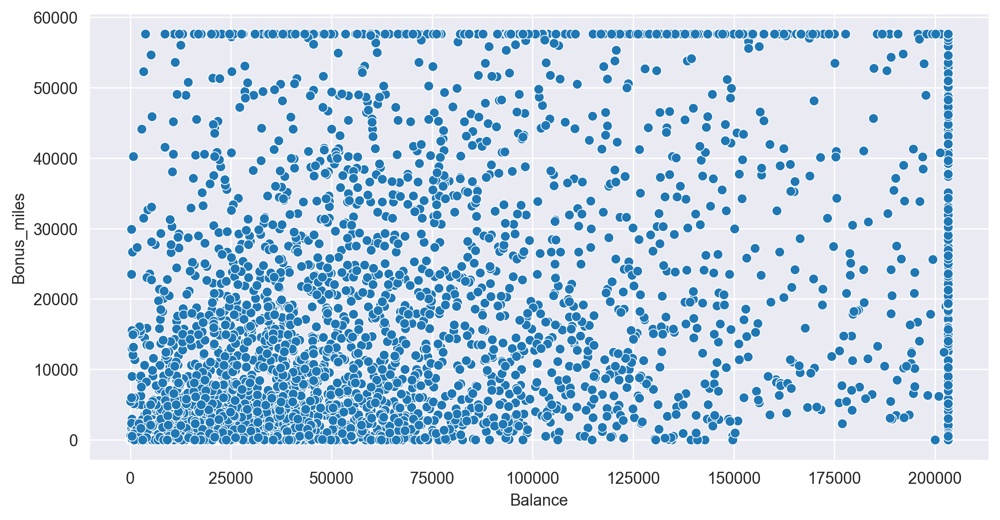

In [14]:
sns.scatterplot(x= df['Balance'], y = df['Bonus_miles'])

In [15]:
from sklearn.preprocessing import StandardScaler

In [16]:
sc = StandardScaler()

x = sc.fit_transform(df)
x

array([[-1.73512503, -0.60725829,  0.        , ..., -0.62614341,
         1.39545434, -0.7669193 ],
       [-1.73426342, -0.75894657,  0.        , ..., -0.62614341,
         1.37995704, -0.7669193 ],
       [-1.73340181, -0.38206963,  0.        , ..., -0.62614341,
         1.41192021, -0.7669193 ],
       ...,
       [ 1.72682006,  0.1675298 ,  0.        , ..., -0.62614341,
        -1.31560393,  1.30391816],
       [ 1.72768167, -0.15118775,  0.        , ...,  0.43238439,
        -1.31608822, -0.7669193 ],
       [ 1.72854328, -1.03556163,  0.        , ..., -0.62614341,
        -1.31754109, -0.7669193 ]])

In [17]:
x[:,0]

array([-1.73512503, -1.73426342, -1.73340181, ...,  1.72682006,
        1.72768167,  1.72854328])

In [18]:
from sklearn.cluster import KMeans

In [19]:
df.head()

,ID#,Balance,Qual_miles,cc1_miles,cc2_miles,cc3_miles,Bonus_miles,Bonus_trans,Flight_miles_12mo,Flight_trans_12,Days_since_enroll,Award?
0,1.0,28143.0,0.0,1.0,1.0,1.0,174.0,1.0,0.0,0.0,7000.0,0.0
1,2.0,19244.0,0.0,1.0,1.0,1.0,215.0,2.0,0.0,0.0,6968.0,0.0
2,3.0,41354.0,0.0,1.0,1.0,1.0,4123.0,4.0,0.0,0.0,7034.0,0.0
3,4.0,14776.0,0.0,1.0,1.0,1.0,500.0,1.0,0.0,0.0,6952.0,0.0
4,5.0,97752.0,0.0,4.0,1.0,1.0,43300.0,26.0,777.5,2.5,6935.0,1.0


In [20]:
km = KMeans()
yp = km.fit_predict(x)
yp

array([7, 7, 7, ..., 5, 0, 3])

In [21]:
len(yp)

3999

In [22]:
km.cluster_centers_

array([[ 0.81592597, -0.02686106,  0.        , -0.60625715,  0.        ,
         0.        , -0.45604527, -0.21037643,  1.55958621,  1.58173262,
        -0.77162676,  0.11533098],
       [-0.45092678, -0.40069257,  0.        , -0.2889589 ,  0.        ,
         0.        , -0.33312966, -0.1976597 , -0.48401369, -0.48658627,
         0.43299803,  1.30391816],
       [-0.93765129,  0.95821193,  0.        ,  1.46534401,  0.        ,
         0.        ,  1.40674071,  0.68042051, -0.45667628, -0.44652897,
         0.93975231,  0.3012955 ],
       [ 1.04651392, -0.62331074,  0.        , -0.7270834 ,  0.        ,
         0.        , -0.70522726, -0.67038202, -0.55575377, -0.5515992 ,
        -1.04484146, -0.64576521],
       [-0.89274834,  0.64022623,  0.        , -0.54907936,  0.        ,
         0.        , -0.31561882,  0.17642749,  1.70356631,  1.71584934,
         0.89082882,  0.51995826],
       [ 0.66060941,  0.15915859,  0.        ,  0.88615595,  0.        ,
         0.        ,  

In [23]:
x

array([[-1.73512503, -0.60725829,  0.        , ..., -0.62614341,
         1.39545434, -0.7669193 ],
       [-1.73426342, -0.75894657,  0.        , ..., -0.62614341,
         1.37995704, -0.7669193 ],
       [-1.73340181, -0.38206963,  0.        , ..., -0.62614341,
         1.41192021, -0.7669193 ],
       ...,
       [ 1.72682006,  0.1675298 ,  0.        , ..., -0.62614341,
        -1.31560393,  1.30391816],
       [ 1.72768167, -0.15118775,  0.        , ...,  0.43238439,
        -1.31608822, -0.7669193 ],
       [ 1.72854328, -1.03556163,  0.        , ..., -0.62614341,
        -1.31754109, -0.7669193 ]])

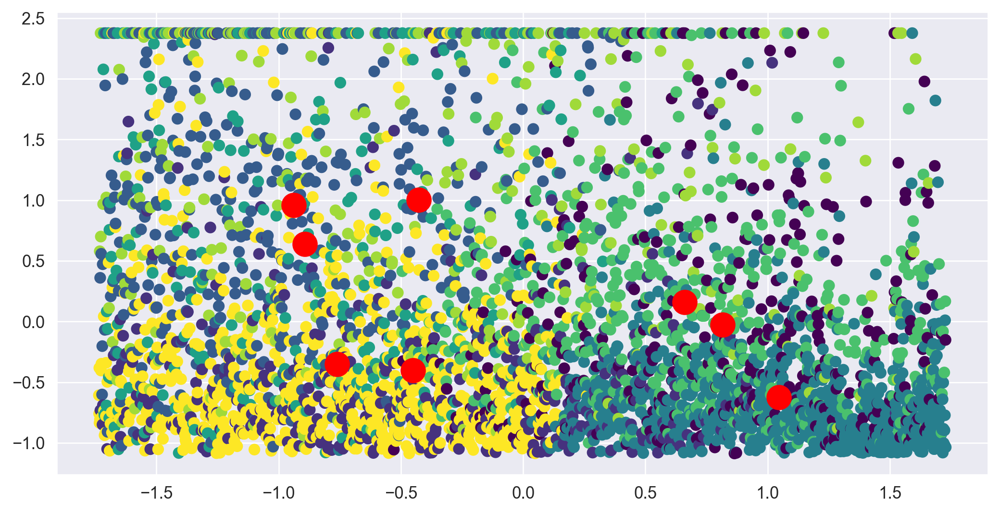

In [24]:
plt.scatter(x[:,0],x[:,1], c = yp, cmap='viridis')
plt.scatter(km.cluster_centers_[:,0],km.cluster_centers_[:,1], c = 'red',s = 200)

In [25]:
km.cluster_centers_

array([[ 0.81592597, -0.02686106,  0.        , -0.60625715,  0.        ,
         0.        , -0.45604527, -0.21037643,  1.55958621,  1.58173262,
        -0.77162676,  0.11533098],
       [-0.45092678, -0.40069257,  0.        , -0.2889589 ,  0.        ,
         0.        , -0.33312966, -0.1976597 , -0.48401369, -0.48658627,
         0.43299803,  1.30391816],
       [-0.93765129,  0.95821193,  0.        ,  1.46534401,  0.        ,
         0.        ,  1.40674071,  0.68042051, -0.45667628, -0.44652897,
         0.93975231,  0.3012955 ],
       [ 1.04651392, -0.62331074,  0.        , -0.7270834 ,  0.        ,
         0.        , -0.70522726, -0.67038202, -0.55575377, -0.5515992 ,
        -1.04484146, -0.64576521],
       [-0.89274834,  0.64022623,  0.        , -0.54907936,  0.        ,
         0.        , -0.31561882,  0.17642749,  1.70356631,  1.71584934,
         0.89082882,  0.51995826],
       [ 0.66060941,  0.15915859,  0.        ,  0.88615595,  0.        ,
         0.        ,  

In [26]:
km.inertia_

12765.597099162494

In [27]:
wcss = []

for i in range(1,11):
    km = KMeans(n_clusters=i)
    km.fit_predict(x)
    wcss.append(km.inertia_)

In [28]:
wcss

[35991.00000000001,
 25870.575217727415,
 21297.45803679808,
 17966.53080178121,
 15803.555144029913,
 14525.61573523889,
 13601.693515838357,
 12802.635387801865,
 12060.065028090197,
 11513.23774352115]

Text(0.5, 1.0, 'Elbow Graph')

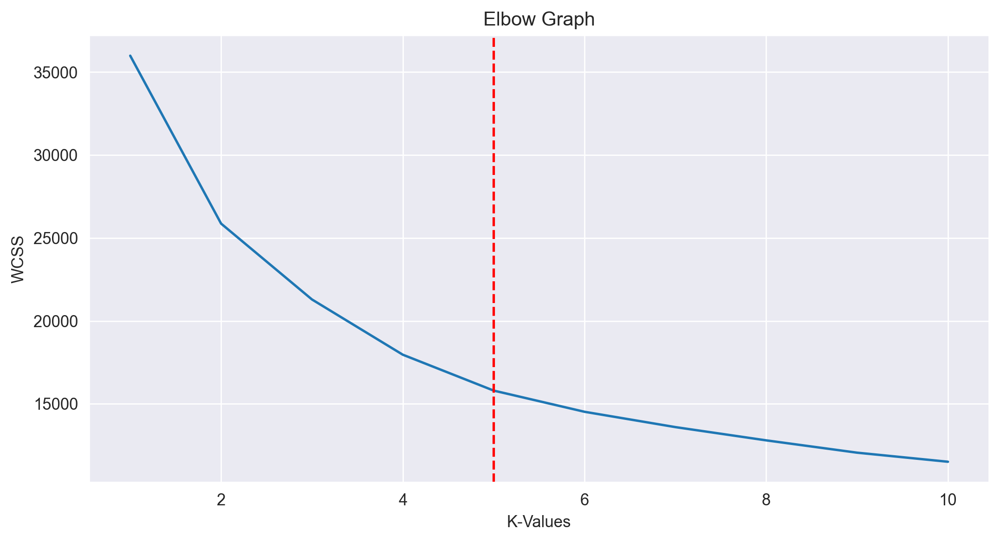

In [29]:
plt.plot(range(1,11),wcss)
plt.axvline(x = 5, linestyle = '--', color = 'red')
plt.xlabel('K-Values')
plt.ylabel('WCSS')
plt.title('Elbow Graph')

In [30]:
km = KMeans(n_clusters=5)
ypred = km.fit_predict(x)
ypred

array([0, 0, 0, ..., 3, 3, 3])

In [31]:
km.cluster_centers_

array([[-0.80715593, -0.35237997,  0.        , -0.59916266,  0.        ,
         0.        , -0.61279044, -0.51615239, -0.51298627, -0.51852458,
         0.78569017, -0.33720433],
       [-0.31813677,  0.50116405,  0.        ,  1.20158749,  0.        ,
         0.        ,  1.02687516,  0.63409261, -0.48637245, -0.47527001,
         0.32311422,  0.39010505],
       [-0.53644621,  1.10198466,  0.        ,  1.46023734,  0.        ,
         0.        ,  1.64690523,  1.50304929,  1.59009978,  1.53928577,
         0.54681463,  0.89197737],
       [ 0.98748215, -0.54217013,  0.        , -0.56914416,  0.        ,
         0.        , -0.58115478, -0.4981159 , -0.52305417, -0.51584377,
        -0.98883509, -0.45646426],
       [ 0.09328101,  0.25419023,  0.        , -0.57445845,  0.        ,
         0.        , -0.38133507, -0.02691632,  1.66719778,  1.67711768,
        -0.06900743,  0.3528403 ]])

In [32]:
km.cluster_centers_[:,0]

array([-0.80715593, -0.31813677, -0.53644621,  0.98748215,  0.09328101])

In [33]:
km.cluster_centers_[:,1]

array([-0.35237997,  0.50116405,  1.10198466, -0.54217013,  0.25419023])

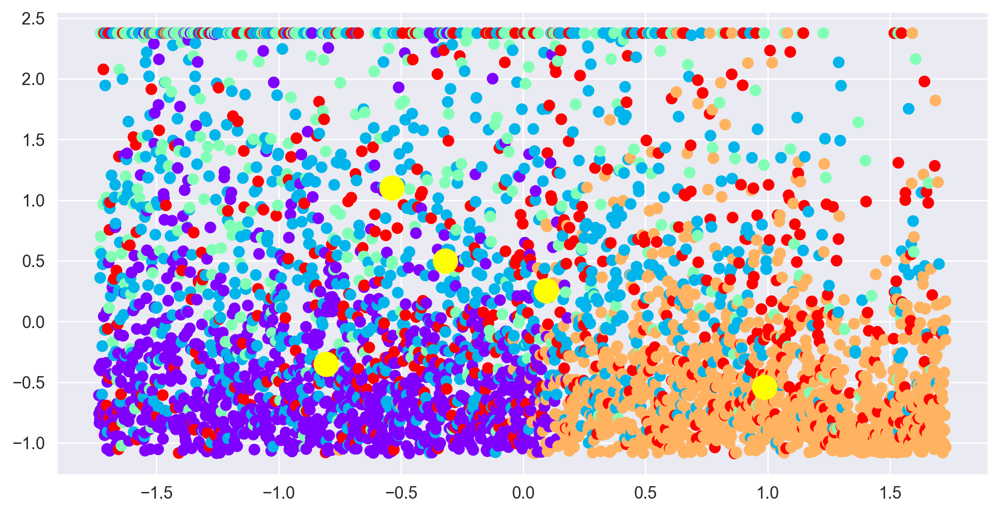

In [34]:
plt.scatter(x[:,0],x[:,1], c = ypred, cmap='rainbow')
plt.scatter(km.cluster_centers_[:,0],km.cluster_centers_[:,1], c = 'yellow',s = 200)

In [35]:
from sklearn.metrics import silhouette_score

In [36]:
x

array([[-1.73512503, -0.60725829,  0.        , ..., -0.62614341,
         1.39545434, -0.7669193 ],
       [-1.73426342, -0.75894657,  0.        , ..., -0.62614341,
         1.37995704, -0.7669193 ],
       [-1.73340181, -0.38206963,  0.        , ..., -0.62614341,
         1.41192021, -0.7669193 ],
       ...,
       [ 1.72682006,  0.1675298 ,  0.        , ..., -0.62614341,
        -1.31560393,  1.30391816],
       [ 1.72768167, -0.15118775,  0.        , ...,  0.43238439,
        -1.31608822, -0.7669193 ],
       [ 1.72854328, -1.03556163,  0.        , ..., -0.62614341,
        -1.31754109, -0.7669193 ]])

In [37]:
silhouette_score(x,ypred)

0.2523371470902339

In [38]:
df['cluster'] = ypred
df

,ID#,Balance,Qual_miles,cc1_miles,cc2_miles,cc3_miles,Bonus_miles,Bonus_trans,Flight_miles_12mo,Flight_trans_12,Days_since_enroll,Award?,cluster
0,1.0,28143.0,0.0,1.0,1.0,1.0,174.0,1.0,0.0,0.0,7000.0,0.0,0
1,2.0,19244.0,0.0,1.0,1.0,1.0,215.0,2.0,0.0,0.0,6968.0,0.0,0
2,3.0,41354.0,0.0,1.0,1.0,1.0,4123.0,4.0,0.0,0.0,7034.0,0.0,0
3,4.0,14776.0,0.0,1.0,1.0,1.0,500.0,1.0,0.0,0.0,6952.0,0.0,0
4,5.0,97752.0,0.0,4.0,1.0,1.0,43300.0,26.0,777.5,2.5,6935.0,1.0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...
3994,4017.0,18476.0,0.0,1.0,1.0,1.0,8525.0,4.0,200.0,1.0,1403.0,1.0,3
3995,4018.0,64385.0,0.0,1.0,1.0,1.0,981.0,5.0,0.0,0.0,1395.0,1.0,3
3996,4019.0,73597.0,0.0,3.0,1.0,1.0,25447.0,8.0,0.0,0.0,1402.0,1.0,3
3997,4020.0,54899.0,0.0,1.0,1.0,1.0,500.0,1.0,500.0,1.0,1401.0,0.0,3


In [39]:
df.groupby('cluster').agg('mean')

,ID#,Balance,Qual_miles,cc1_miles,cc2_miles,cc3_miles,Bonus_miles,Bonus_trans,Flight_miles_12mo,Flight_trans_12,Days_since_enroll,Award?
cluster,,,,,,,,,,,,
0,1077.784969,42986.225209,0.0,1.234864,1.0,1.0,4329.918580,6.771399,26.675887,0.100731,5741.371608,0.206681
1,1645.583808,93170.108609,0.0,3.713797,1.0,1.0,33968.904789,17.249715,34.750285,0.142531,4785.750285,0.558723
2,1392.209677,128418.069220,0.0,4.069892,1.0,1.0,45174.381720,25.169355,646.564516,2.045699,5247.663978,0.801075
3,3160.910214,31961.485585,0.0,1.275947,1.0,1.0,4907.826400,6.930807,23.942339,0.104201,2076.737232,0.149918
4,2121.662630,78801.073097,0.0,1.268166,1.0,1.0,8522.057526,11.209343,668.555363,2.173875,3978.359862,0.541522


In [40]:
df['cluster'].value_counts()

3    1214
0     958
1     877
4     578
2     372
Name: cluster, dtype: int64